# HW4 Structue From Motion 3d Reconstruction

### Running the dataset using colmap



I ran the buddha_images dataset using the colmap docker image maintained on Dockerhub. This removes the complexities of installing all the dependencies and building the colmap libraries. 


The automatic reconstructor was used to generate a sparse and dense 3D reconstruction of the Buddha dataset using the below command.

$ docker run --rm -v $(pwd):/data colmap/colmap colmap automatic_reconstructor --image_path /data/images --workspace_path /data/output


The output bin files were converted to readable txt format to check for the (intrinsic and extrinsic) parameters of the camera.

$ docker run --rm -v $(pwd)/data:/data colmap/colmap colmap model_converter --input_path /data/output/sparse/0 --output_path /data/output/text_output --output_type TXT

The results of the reconstruction are:

![Front View](colmap_output/colmap_front.png)
![Side View](colmap_output/colmap_side.png)

The Camera Intrinsic matrix (no skew) from colmap is
$$
K =
\begin{pmatrix}
  f & 0 & c_x \\
  0 & f & c_y \\
  0 & 0 & 1
\end{pmatrix}

= 
\begin{pmatrix}
  1700 & 0 & 540 \\
  0 & 1700 & 960 \\
  0 & 0 & 1
\end{pmatrix}
$$

### Finding Essential and Fundamental Matrices

In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from scipy.optimize import least_squares
import gtsam

import plotly.graph_objects as go

In [2]:
from lightglue import LightGlue, SuperPoint, DISK
from lightglue.utils import load_image, rbd
from lightglue import viz2d
import torch

from pathlib import Path
torch.set_grad_enabled(False)
images = Path("datasets/6images").glob("*.tif")


/home/anatharv1/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


We are using Superpoint for Feature detection & extraction and LightGlue for feature matching

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # 'mps', 'cpu'
extractor = SuperPoint(
    max_num_keypoints=4096,    # Doubled from 1024
    keypoint_threshold=0.001,  # 10x lower for more features
    nms_radius=5              # Slightly more dense
).eval().to(device)

matcher = LightGlue(
    features="superpoint",
    filter_threshold=0.6      # Lower for more matches
).eval().to(device)

In [4]:
# Apply CLAHE to enhance contrast as the dataset has low contrast images with tensor input
# Copied from HW2 solution
def apply_CLAHE(image_tensor: torch.Tensor, clip_limit: float = 2.0, tile_grid_size: tuple = (8, 8)) -> torch.Tensor:

    # Detach from GPU and convert to NumPy array as OpenCV works with NumPy arrays
    img_np = image_tensor.cpu().numpy()

    # Handle (C, H, W) format, and ensure it's single channel
    if img_np.ndim == 3:
        if img_np.shape[0] == 1:
            img_np = img_np.squeeze(0)  # Convert (1, H, W) to (H, W)
        else:
            # For robustness, handle common RGB cases by converting to grayscale if needed
            # Assuming image is BGR/RGB if C=3, convert to grayscale 
            if img_np.shape[0] == 3:
                # Transpose from (C, H, W) to (H, W, C) for OpenCV processing
                img_np = np.transpose(img_np, (1, 2, 0))
                # Convert normalized float [0, 1] to 8-bit integer [0, 255]
                img_np = (img_np * 255).astype(np.uint8)
                img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
            else:
                 raise ValueError(f"Input tensor has unsupported channels: {img_np.shape[0]}")
    
    # Scale float [0, 1] to 8-bit integer [0, 255] for CLAHE
    if img_np.dtype != np.uint8:
        # Check if the image is float [0, 1] and scale
        if img_np.max() <= 1.01 and img_np.min() >= -0.01:
            img_np = (img_np * 255).astype(np.uint8)
        else:
            # Assume it's an unscaled image, convert directly
            img_np = img_np.astype(np.uint8)

    
    # Create a CLAHE object
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    
    # Apply CLAHE to the image
    clahe_img_np = clahe.apply(img_np)

    # Convert back to float [0, 1]
    clahe_img_np = clahe_img_np.astype(np.float32) / 255.0
    
    # Convert back to PyTorch tensor
    clahe_tensor = torch.from_numpy(clahe_img_np)
    
    # Re-add the channel dimension (H, W) -> (1, H, W) if original was 3D or if requested
    if image_tensor.dim() == 3:
        clahe_tensor = clahe_tensor.unsqueeze(0)
    
    # Restore device and dtype
    clahe_tensor = clahe_tensor.to(image_tensor.device, image_tensor.dtype)

    return clahe_tensor


666


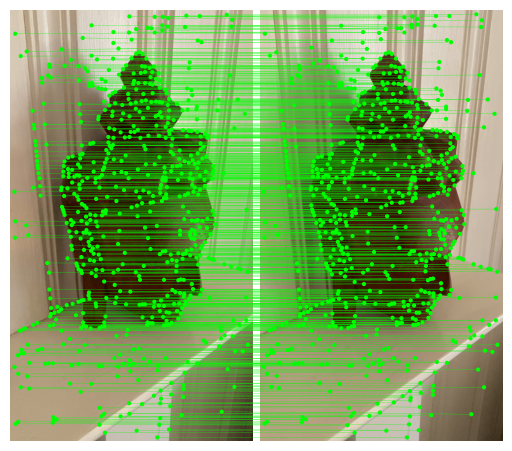

In [5]:
# Sanity checks with buddha initial images
image0 = load_image("data/buddha_images/buddha_001.png")
image1 = load_image("data/buddha_images/buddha_002.png")

feats0 = extractor.extract(image0.to(device))
feats1 = extractor.extract(image1.to(device))

matches01 = matcher({"image0": feats0, "image1": feats1})

feats0, feats1, matches01 = [
    rbd(x) for x in [feats0, feats1, matches01]
]  # remove batch dimension

kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]
axes = viz2d.plot_images([image0, image1])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
print(len(m_kpts0))


In [6]:
# Function to find keypoints using SuperPoint 
def find_keypoints(image0):

  feats0 = extractor.extract(image0.to(device))
  

  return feats0

In [7]:
# find Lightglue Image matches using SuperPoint keypoints
def find_matches(image0, image1, feats0, feats1, text, viz_on=False):


  matches01 = matcher({"image0": feats0, "image1": feats1})
  feats0, feats1, matches01 = [
      rbd(x) for x in [feats0, feats1, matches01]
  ]  # remove batch dimension
  kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
  m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

  

  if viz_on:
    axes = viz2d.plot_images([image0, image1])
    viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
    viz2d.add_text(0, text, fs=20)
  

  return m_kpts0, m_kpts1, kpts0

Number of matches between Image 1 & 2: 768
Number of matches between Image 2 & 3: 680
Number of matches between Image 3 & 4: 614
Number of matches between Image 4 & 5: 429
Number of matches between Image 5 & 6: 410
Number of matches between Image 6 & 7: 506
Number of matches between Image 7 & 8: 501
Number of matches between Image 8 & 9: 443
Number of matches between Image 9 & 10: 418
Number of matches between Image 10 & 11: 432
Number of matches between Image 11 & 12: 467
Number of matches between Image 12 & 13: 494
Number of matches between Image 13 & 14: 422
Number of matches between Image 14 & 15: 385
Number of matches between Image 15 & 16: 452
Number of matches between Image 16 & 17: 464
Number of matches between Image 17 & 18: 470
Number of matches between Image 18 & 19: 459
Number of matches between Image 19 & 20: 465
Number of matches between Image 20 & 21: 504
Number of matches between Image 21 & 22: 521


/home/anatharv1/LightGlue/lightglue/viz2d.py:83: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(


Number of matches between Image 22 & 23: 474
Number of matches between Image 23 & 24: 420


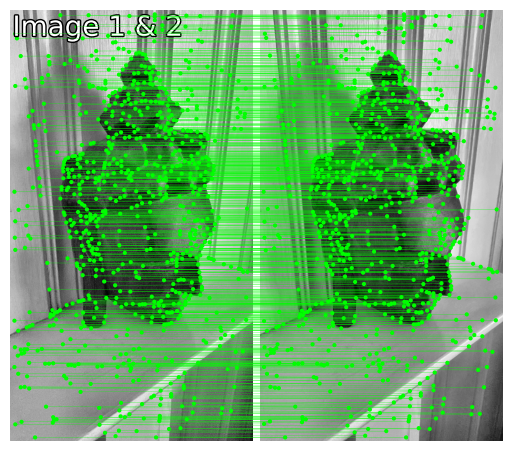

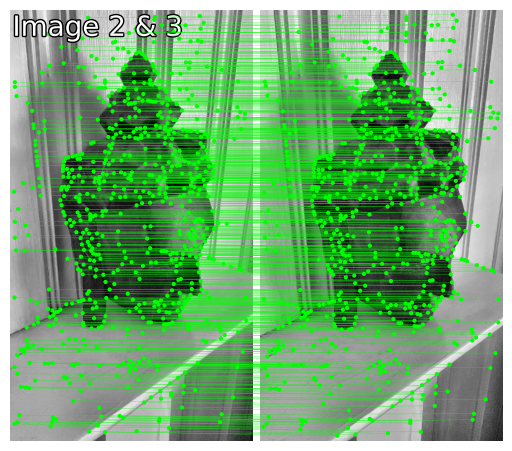

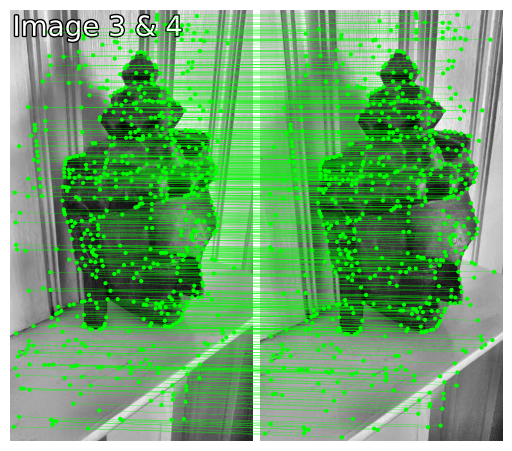

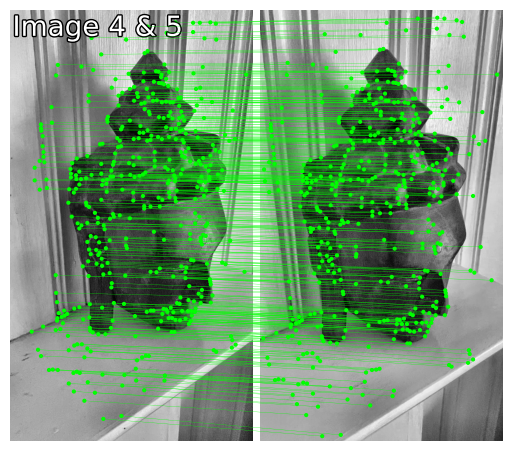

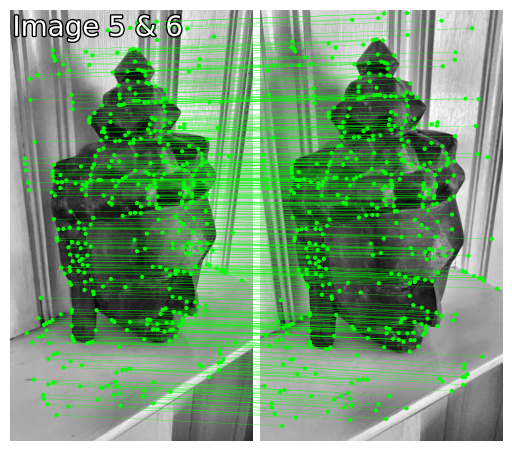

...

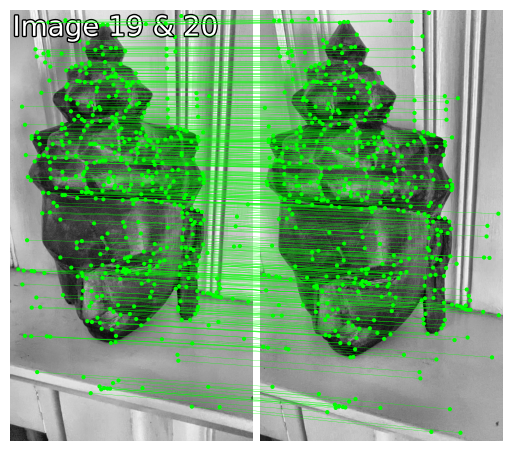

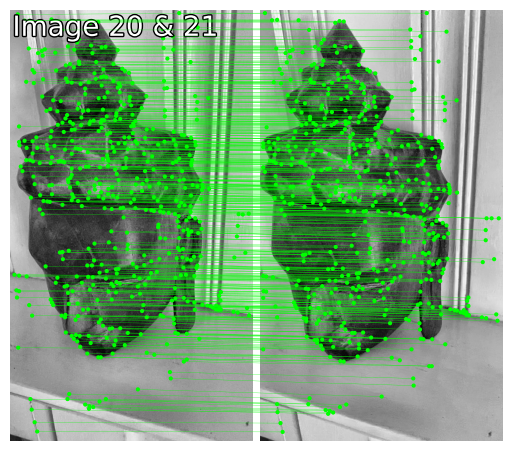

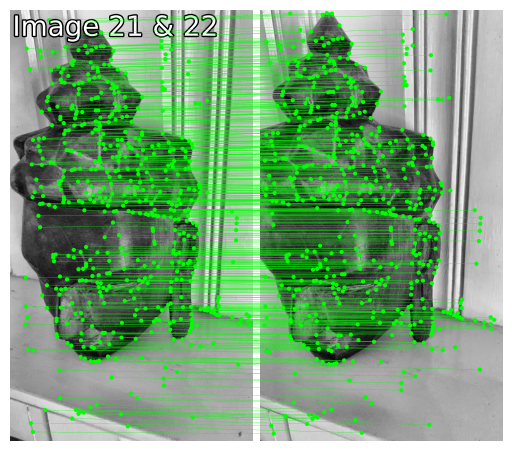

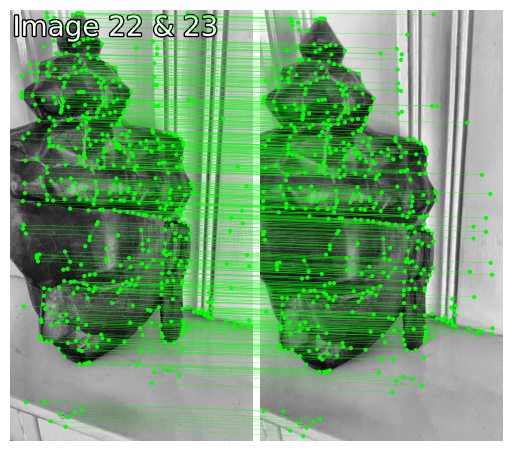

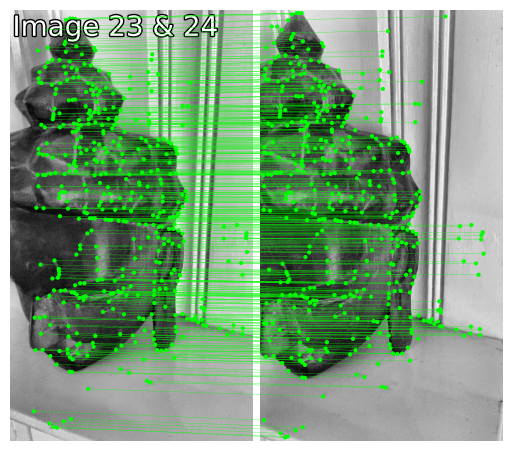

In [8]:
image_list = []
image_list_numpy = []
for i in range(1,25):
    string_num = str(i).zfill(3)
    image = load_image(f"data/buddha_images/buddha_{string_num}.png")
    
    image_list_numpy.append(image.squeeze().cpu().numpy())
    image = apply_CLAHE(image, clip_limit=2.0, tile_grid_size=(8,8))
    image_list.append(image)
    
    
    
    
image_keypoints=[]
image_matches=[]
    
for i in range(len(image_list)):

    feats = find_keypoints(image_list[i])
    image_keypoints.append(feats)
    
for i in range(len(image_list)-1):

    m_kpts0, m_kpts1, kpts0 = find_matches(image_list[i], image_list[i+1], image_keypoints[i], image_keypoints[i+1], f"Image {i+1} & {i+2}", viz_on=True)
    print(f"Number of matches between Image {i+1} & {i+2}: {len(m_kpts0)}")
    image_matches.append((m_kpts0, m_kpts1, kpts0))





In [9]:
# Essential and Fundamental Matrix Computation Functions
def normalize_points(pts):
    # Normalize points to improve numerical stability
    centroid = np.mean(pts, axis=0)
    pts_centered = pts - centroid
    scale = np.sqrt(2) / np.mean(np.sqrt(np.sum(pts_centered**2, axis=1)))
    T = np.array([[scale, 0, -scale*centroid[0]], 
                  [0, scale, -scale*centroid[1]], 
                  [0, 0, 1]])
    pts_normalized = (T @ np.column_stack([pts, np.ones(len(pts))]).T).T[:, :2]
    return pts_normalized, T


def compute_fundamental_8point(pts1, pts2):
    # Compute fundamental matrix using normalized 8-point algorithm
    pts1_norm, T1 = normalize_points(pts1)
    pts2_norm, T2 = normalize_points(pts2)
    A = np.zeros((len(pts1_norm), 9))
    for i in range(len(pts1_norm)):
        x1, y1 = pts1_norm[i]
        x2, y2 = pts2_norm[i]
        A[i] = [x2*x1, x2*y1, x2, y2*x1, y2*y1, y2, x1, y1, 1]
    _, _, Vt = np.linalg.svd(A)
    F = Vt[-1].reshape(3, 3)
    U, S, Vt = np.linalg.svd(F)
    S[2] = 0
    F = U @ np.diag(S) @ Vt
    F = T2.T @ F @ T1
    return F / F[2, 2]

def compute_fundamental_ransac(pts1, pts2, threshold=1.0, max_iters=2000):
    # Compute fundamental matrix using RANSAC
    best_F = None
    best_inliers = []
    n = len(pts1)
    for _ in range(max_iters):
        idx = np.random.choice(n, 8, replace=False)
        F = compute_fundamental_8point(pts1[idx], pts2[idx])
        pts1_h = np.column_stack([pts1, np.ones(n)])
        pts2_h = np.column_stack([pts2, np.ones(n)])
        errors = np.abs(np.sum(pts2_h * (F @ pts1_h.T).T, axis=1))
        inliers = np.where(errors < threshold)[0]
        if len(inliers) > len(best_inliers):
            best_inliers = inliers
            best_F = F
    if len(best_inliers) >= 8:
        best_F = compute_fundamental_8point(pts1[best_inliers], pts2[best_inliers])
    return best_F, best_inliers

In [10]:
F_list =[]
for i in range(len(image_matches)):
    m_kpts0, m_kpts1, kpts0 = image_matches[i]
    pts1 = m_kpts0.cpu().numpy()
    pts2 = m_kpts1.cpu().numpy()
    F, inliers = compute_fundamental_ransac(pts1, pts2, threshold=0.02, max_iters=2000)
    F_list.append(F)
    print(f"Image Pair {i+1} & {i+2}:")
    print("Fundamental Matrix:\n", F)
    print("Number of Inliers:", len(inliers))

Image Pair 1 & 2:
Fundamental Matrix:
 [[ 1.45823814e-06  3.29570478e-05 -6.06959381e-02]
 [-3.26328226e-05 -2.19586814e-08  2.69947244e-02]
 [ 5.81485148e-02 -2.71623765e-02  1.00000000e+00]]
Number of Inliers: 243
Image Pair 2 & 3:
Fundamental Matrix:
 [[ 5.82008965e-07 -1.51114480e-05  9.72917957e-03]
 [ 1.60413564e-05  2.05651401e-07 -1.76905088e-02]
 [-1.14499980e-02  1.68032764e-02  1.00000000e+00]]
Number of Inliers: 243
Image Pair 3 & 4:
Fundamental Matrix:
 [[ 3.89731505e-07  1.96418818e-05 -2.60457566e-02]
 [-1.96609742e-05  2.26962675e-07  1.18812445e-02]
 [ 2.60707714e-02 -1.30544091e-02  1.00000000e+00]]
Number of Inliers: 343
Image Pair 4 & 5:
Fundamental Matrix:
 [[-2.28204743e-07 -4.48774071e-06  8.67228193e-03]
 [ 4.23868390e-06  1.14348855e-07  5.75758988e-03]
 [-8.65106831e-03 -6.59539344e-03  1.00000000e+00]]
Number of Inliers: 209
Image Pair 5 & 6:
Fundamental Matrix:
 [[-9.27097951e-08 -5.55507993e-07  3.25423404e-03]
 [ 4.16403025e-07  2.08859972e-07  7.26232883e

In [11]:
def compute_essential_matrix(F, K):
    # Compute essential matrix from fundamental matrix and intrinsic matrix
    E = K.T @ F @ K
    U, S, Vt = np.linalg.svd(E)
    # Force singular values to be [1, 1, 0] for valid essential matrix
    S = np.array([1, 1, 0])
    E = U @ np.diag(S) @ Vt
    return E

def decompose_essential_matrix(E):
    # Decompose essential matrix into rotation and translation
    U, _, Vt = np.linalg.svd(E)
    W = np.array([[0, -1, 0], [1, 0, 0], [0, 0, 1]])
    
    # Two possible rotations
    R1 = U @ W @ Vt
    R2 = U @ W.T @ Vt
    
    # Ensure determinant is +1 (proper rotation)
    if np.linalg.det(R1) < 0:
        R1 = -R1
    if np.linalg.det(R2) < 0:
        R2 = -R2
    
    # Translation (up to scale)
    t = U[:, 2]
    
    return [R1, R2], [t, -t]

In [12]:
def triangulate_points_linear(P1, P2, pts1, pts2):
    # Linear triangulation using DLT (more stable than cv2.triangulatePoints)
    pts3d = []
    for i in range(len(pts1)):
        x1, y1 = pts1[i]
        x2, y2 = pts2[i]
        
        A = np.array([
            x1 * P1[2] - P1[0],
            y1 * P1[2] - P1[1],
            x2 * P2[2] - P2[0],
            y2 * P2[2] - P2[1]
        ])
        
        _, _, Vt = np.linalg.svd(A)
        X = Vt[-1]
        X = X / X[3]  # Normalize
        pts3d.append(X[:3])
    
    return np.array(pts3d)

def check_pose(R, t, K, pts1, pts2):
    # Check if pose produces valid triangulated points (in front of both cameras)
    P1 = K @ np.hstack([np.eye(3), np.zeros((3, 1))])
    P2 = K @ np.hstack([R, t.reshape(3, 1)])
    
    # Use linear triangulation instead of cv2
    pts3d_euclidean = triangulate_points_linear(P1, P2, pts1, pts2)
    
    # Check points are in front of first camera
    pts1_cam = pts3d_euclidean
    
    # Transform points to second camera frame
    pts2_cam = (R @ pts3d_euclidean.T + t.reshape(3, 1)).T
    
    # Cheirality check: Z > 0 in both camera frames
    valid = (pts1_cam[:, 2] > 0) & (pts2_cam[:, 2] > 0)
    return np.sum(valid), pts3d_euclidean

def recover_pose(E, K, pts1, pts2, image1, image2):
    """
    Recover correct rotation and translation from essential matrix
    """
    # Recover correct rotation and translation from essential matrix
    Rs, ts = decompose_essential_matrix(E)
    best_count = 0
    best_R, best_t, best_pts3d, best_colors = None, None, None, None
    best_pts1 = None  # Store the corresponding pts1 for the best pose
    
    for R in Rs:
        for t in ts:
            count, pts3d = check_pose(R, t, K, pts1, pts2)
            if count > best_count:
                best_count = count
                best_R, best_t, best_pts3d = R, t, pts3d
                best_pts1 = pts1  # Store pts1 for color extraction
    
    print(f"Best pose has {best_count} points in front of both cameras.")
    
    # Extract colors from image1 at the keypoint locations
    if best_pts3d is not None and len(best_pts3d) > 0:
        # Convert image to numpy if it's a tensor
        if hasattr(image1, 'cpu'):
            img1 = image1.cpu().numpy()
        else:
            img1 = image1
        
        # Ensure image is in HWC format with values in [0, 255] or [0, 1]
        if img1.ndim == 3:
            if img1.shape[0] == 3:  # CHW format
                img1 = np.transpose(img1, (1, 2, 0))  # Convert to HWC
        
        # Normalize to [0, 255] if needed
        if img1.max() <= 1.0:
            img1 = (img1 * 255).astype(np.uint8)
        else:
            img1 = img1.astype(np.uint8)
        
        height, width = img1.shape[:2]
        
        # Extract colors at keypoint locations
        best_colors = []
        for pt in best_pts1:
            x, y = int(pt[0]), int(pt[1])
            # Clamp coordinates to image bounds
            x = np.clip(x, 0, width - 1)
            y = np.clip(y, 0, height - 1)
            
            if img1.ndim == 3:  # Color image
                color = img1[y, x, :3]  # Get RGB values
            else:  # Grayscale image
                gray = img1[y, x]
                color = np.array([gray, gray, gray])  # Convert to RGB
            
            best_colors.append(color)
        
        best_colors = np.array(best_colors)
    else:
        best_colors = np.array([])
    
    return best_R, best_t, best_pts3d, best_colors

In [13]:
E_List =[]
# From Colmap, the Camera Intrinsic matrix is
K = np.array([[1700, 0, 540],
              [0, 1700, 960],
              [0, 0, 1]])
for i in range(len(F_list)):
    F = F_list[i]
    E = compute_essential_matrix(F, K)
    E_List.append(E)
    print(f"Image Pair {i+1} & {i+2}:")
    print("Essential Matrix:\n", E)

Image Pair 1 & 2:
Essential Matrix:
 [[ 0.02002866  0.88403785 -0.44285073]
 [-0.88378256  0.01582031  0.14082465]
 [ 0.44309665 -0.15639944  0.00320325]]
Image Pair 2 & 3:
Essential Matrix:
 [[ 0.0240132  -0.93397847 -0.15838096]
 [ 0.93968432  0.02157122 -0.30275604]
 [ 0.15037493  0.32290557  0.00304606]]
Image Pair 3 & 4:
Essential Matrix:
 [[ 0.01774722  0.9767923  -0.20408298]
 [-0.97511916  0.01278327  0.04292488]
 [ 0.21618825 -0.065565    0.00353656]]
Image Pair 4 & 5:
Essential Matrix:
 [[-0.00870474 -0.60917971  0.36420414]
 [ 0.61082987 -0.00501512  0.70460567]
 [-0.37098092 -0.69923775  0.00345775]]
Image Pair 5 & 6:
Essential Matrix:
 [[-0.01690586 -0.10962623  0.32867375]
 [ 0.08094177  0.02821935  0.94173247]
 [-0.34985131 -0.92887113  0.01625959]]
Image Pair 6 & 7:
Essential Matrix:
 [[ 0.0305217   0.94591747 -0.21677013]
 [-0.94363335  0.02814295 -0.24895421]
 [ 0.22336165  0.23283143  0.00206125]]
Image Pair 7 & 8:
Essential Matrix:
 [[ 2.78621792e-02  9.75234450e-01

In [14]:
Transforms = []

Identity_Transform = np.eye(4)
Transforms.append(Identity_Transform)
print("Image 1 Transformation (Identity):\n", Identity_Transform)
for i in range(len(E_List)):
    print(f"Image Pair {i+1} & {i+2}:")
    print("Image Matches Used:", len(image_matches[i][0]))
    E = E_List[i]
    m_kpts0, m_kpts1, kpts0 = image_matches[i]
    pts1 = m_kpts0.cpu().numpy()
    pts2 = m_kpts1.cpu().numpy()
    best_R, best_t, best_pts3d, best_colors = recover_pose(E, K, pts1, pts2, image_list_numpy[i], image_list_numpy[i+1])
    T = np.vstack([np.hstack([best_R, best_t.reshape(3,1)]), [0,0,0,1]])
    Transforms.append(T)
    print("Recovered Transformation:\n", T)



Image 1 Transformation (Identity):
 [[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]
Image Pair 1 & 2:
Image Matches Used: 768
Best pose has 748 points in front of both cameras.
Recovered Transformation:
 [[ 0.99979456 -0.01847696  0.00833286 -0.14818627]
 [ 0.01844867  0.99982383  0.00345887 -0.44592209]
 [-0.0083953  -0.00330443  0.9999593  -0.88271984]
 [ 0.          0.          0.          1.        ]]
Image Pair 2 & 3:
Image Matches Used: 680
Best pose has 648 points in front of both cameras.
Recovered Transformation:
 [[ 9.99584693e-01  2.26866791e-02  1.77695340e-02 -3.19410480e-01]
 [-2.27038249e-02  9.99741943e-01  7.63734382e-04  1.57692265e-01]
 [-1.77476218e-02 -1.16685358e-03  9.99841818e-01 -9.34403604e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Image Pair 3 & 4:
Image Matches Used: 614
Best pose has 594 points in front of both cameras.
Recovered Transformation:
 [[ 0.99970006 -0.01395909  0.02012302 -0.06254575]
 [ 0.01369286  0.9

In [15]:
def create_sfm_visualization(Transforms, all_pts3d_list, all_colors_list, image_matches):
    """
    Create 3D visualization of camera poses and triangulated points with actual colors
    """
    
    # Extract camera positions from transformation matrices
    camera_positions = []
    
    # First camera at origin
    camera_positions.append([0, 0, 0])
    
    # Compute absolute camera positions by chaining transformations
    cumulative_transform = np.eye(4)
    for i, T in enumerate(Transforms[1:], 1):
        cumulative_transform = cumulative_transform @ T
        camera_pos = cumulative_transform[:3, 3]
        camera_positions.append(camera_pos)
    
    camera_positions = np.array(camera_positions)
    
    # Collect all 3D points and their colors
    all_points = []
    all_colors_rgb = []
    
    for idx, (pts3d, colors) in enumerate(zip(all_pts3d_list, all_colors_list)):
        if pts3d is not None and len(pts3d) > 0:
            # Transform points to world coordinates
            cumulative_transform = np.eye(4)
            for i in range(idx + 1):
                cumulative_transform = cumulative_transform @ Transforms[i]
            
            # Apply transformation to points
            pts_homogeneous = np.hstack([pts3d, np.ones((pts3d.shape[0], 1))])
            pts_world = (cumulative_transform @ pts_homogeneous.T).T
            
            all_points.append(pts_world[:, :3])
            all_colors_rgb.append(colors)
    
    # Concatenate all points
    if all_points:
        all_points = np.vstack(all_points)
        all_colors_rgb = np.vstack(all_colors_rgb)
        
        # Convert RGB to hex colors for Plotly or normalize to [0, 1]
        # Normalize colors to [0, 1] range if they're in [0, 255]
        if all_colors_rgb.max() > 1.0:
            all_colors_rgb = all_colors_rgb / 255.0
    else:
        all_points = np.array([])
        all_colors_rgb = np.array([])
    
    # Create figure
    fig = go.Figure()
    
    # Add 3D points with actual colors
    if len(all_points) > 0:
        # Convert RGB array to color strings for Plotly
        color_strings = [f'rgb({int(c[0]*255)},{int(c[1]*255)},{int(c[2]*255)})' 
                        for c in all_colors_rgb]
        
        fig.add_trace(go.Scatter3d(
            x=all_points[:, 0],
            y=all_points[:, 1],
            z=all_points[:, 2],
            mode='markers',
            marker=dict(
                size=2,
                color=color_strings,
                opacity=0.8
            ),
            name='3D Points',
            hovertemplate='X: %{x:.2f}<br>Y: %{y:.2f}<br>Z: %{z:.2f}<extra></extra>'
        ))
    
    # Add camera positions
    fig.add_trace(go.Scatter3d(
        x=camera_positions[:, 0],
        y=camera_positions[:, 1],
        z=camera_positions[:, 2],
        mode='markers+text',
        marker=dict(
            size=3,
            color='red',
            symbol='diamond',
            line=dict(color='darkred', width=2)
        ),
        text=[f'Cam {i+1}' for i in range(len(camera_positions))],
        textposition='top center',
        name='Cameras',
        hovertemplate='Camera %{text}<br>X: %{x:.2f}<br>Y: %{y:.2f}<br>Z: %{z:.2f}<extra></extra>'
    ))
    
    # Add camera trajectory
    fig.add_trace(go.Scatter3d(
        x=camera_positions[:, 0],
        y=camera_positions[:, 1],
        z=camera_positions[:, 2],
        mode='lines',
        line=dict(color='red', width=3),
        name='Camera Path',
        showlegend=True
    ))
    
    # Update layout with fixed axis ranges
    fig.update_layout(
        title='3D Structure from Motion Reconstruction',
        scene=dict(
            xaxis=dict(title='X', range=[-15, 15]),
            yaxis=dict(title='Y', range=[-15, 15]),
            zaxis=dict(title='Z', range=[-10, 40]),
            aspectmode='cube',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5)
            )
        ),
        width=1200,
        height=900,
        showlegend=True
    )
    
    return fig



In [16]:
all_pts3d_list = []
all_colors_list = []

for i in range(len(E_List)):
    E = E_List[i]
    m_kpts0, m_kpts1, kpts0 = image_matches[i]
    pts1 = m_kpts0.cpu().numpy()
    pts2 = m_kpts1.cpu().numpy()
    print(f"Processing Image Pair {i+1} & {i+2} with {len(pts1)} matches.")
    image1 = image_list_numpy[i]     
    image2 = image_list_numpy[i + 1] 
    
    best_R, best_t, best_pts3d, best_colors = recover_pose(E, K, pts1, pts2, image1, image2)
    
    all_pts3d_list.append(best_pts3d)
    all_colors_list.append(best_colors)
    

    T = np.vstack([np.hstack([best_R, best_t.reshape(3,1)]), [0,0,0,1]])
    Transforms.append(T)

# Create visualization with colored points
fig = create_sfm_visualization(Transforms, all_pts3d_list, all_colors_list, image_matches)
fig.show()

Processing Image Pair 1 & 2 with 768 matches.
Best pose has 748 points in front of both cameras.
Processing Image Pair 2 & 3 with 680 matches.
Best pose has 648 points in front of both cameras.
Processing Image Pair 3 & 4 with 614 matches.
Best pose has 594 points in front of both cameras.
Processing Image Pair 4 & 5 with 429 matches.
Best pose has 429 points in front of both cameras.
Processing Image Pair 5 & 6 with 410 matches.
Best pose has 410 points in front of both cameras.
Processing Image Pair 6 & 7 with 506 matches.
Best pose has 427 points in front of both cameras.
Processing Image Pair 7 & 8 with 501 matches.
Best pose has 345 points in front of both cameras.
Processing Image Pair 8 & 9 with 443 matches.
Best pose has 443 points in front of both cameras.
Processing Image Pair 9 & 10 with 418 matches.
Best pose has 418 points in front of both cameras.
Processing Image Pair 10 & 11 with 432 matches.
Best pose has 432 points in front of both cameras.
Processing Image Pair 11 & 

### Joint Optimization of Poses using Consecutive matches

In [17]:
import gtsam
import numpy as np
from gtsam import symbol_shorthand
L = symbol_shorthand.L  # Landmark
X = symbol_shorthand.X  # Pose

def bundle_adjustment_gtsam(all_pts3d_list, all_colors_list, image_matches, Transforms, K, match_quality_scores):
    """
    Perform Bundle Adjustment using GTSAM
    """
    
    # Create GTSAM factor graph and initial estimates
    graph = gtsam.NonlinearFactorGraph()
    initial_estimate = gtsam.Values()
    
    # Camera calibration
    fx, fy = K[0, 0], K[1, 1]
    cx, cy = K[0, 2], K[1, 2]
    cal3 = gtsam.Cal3_S2(fx, fy, 0.0, cx, cy)
    
    # Add prior on first pose (fix world frame)
    pose_noise_first = gtsam.noiseModel.Diagonal.Sigmas(np.array([0.001, 0.001, 0.001, 0.001, 0.001, 0.001]))
    first_pose = gtsam.Pose3()
    graph.add(gtsam.PriorFactorPose3(X(0), first_pose, pose_noise_first))
    initial_estimate.insert(X(0), first_pose)
    
    # Compute absolute poses from relative transformations
    absolute_poses = [np.eye(4)]
    cumulative_transform = np.eye(4)
    
    for i, T in enumerate(Transforms[1:], 1):
        cumulative_transform = cumulative_transform @ T
        absolute_poses.append(cumulative_transform.copy())
        
        # Convert to GTSAM Pose3
        R = cumulative_transform[:3, :3]
        t = cumulative_transform[:3, 3]
        pose = gtsam.Pose3(gtsam.Rot3(R), gtsam.Point3(t))
        initial_estimate.insert(X(i), pose)
    
    # Track unique 3D points across views
    point_id = 0
    point_to_observations = {}  # Map point_id -> [(camera_id, pixel_coords)]
    point_to_world_coords = {}  # Map point_id -> 3D coordinates
    point_to_colors = {}        # Map point_id -> RGB color
    
    # Process each image pair
    for pair_idx in range(len(all_pts3d_list)):
        pts3d = all_pts3d_list[pair_idx]
        colors = all_colors_list[pair_idx]
        m_kpts0, m_kpts1, _ = image_matches[pair_idx]
        
        if pts3d is None or len(pts3d) == 0:
            continue
        
        pts1 = m_kpts0.cpu().numpy()
        pts2 = m_kpts1.cpu().numpy()
        
        # Transform points to world coordinates
        cumulative_transform = np.eye(4)
        for i in range(pair_idx + 1):
            cumulative_transform = cumulative_transform @ Transforms[i]
        
        pts_homogeneous = np.hstack([pts3d, np.ones((pts3d.shape[0], 1))])
        pts_world = (cumulative_transform @ pts_homogeneous.T).T[:, :3]
        
        # Adaptive noise model based on match quality
        quality_score = match_quality_scores[pair_idx]
        
        # Base pixel noise (in pixels)
        base_pixel_noise = 0.1
        
        # Scale noise inversely with quality (higher quality = lower noise)
        # quality_score ranges from 0 to 1
        pixel_noise = base_pixel_noise / (0.5 + quality_score)
        
        # Clamp noise to reasonable bounds
        pixel_noise = np.clip(pixel_noise, 0.5, 5.0)
        
        measurement_noise = gtsam.noiseModel.Isotropic.Sigma(2, pixel_noise)
        
        # Add observations for each triangulated point
        for i in range(len(pts3d)):
            # Add landmark to initial estimate
            point_world = gtsam.Point3(float(pts_world[i, 0]), float(pts_world[i, 1]), float(pts_world[i, 2]))
            initial_estimate.insert(L(point_id), point_world)
            
            # Add projection factors for both cameras
            # Camera 0 (pair_idx)
            pt1 = gtsam.Point2(float(pts1[i, 0]), float(pts1[i, 1]))
            factor1 = gtsam.GenericProjectionFactorCal3_S2(
                pt1, measurement_noise, X(pair_idx), L(point_id), cal3
            )
            graph.add(factor1)
            
            # Camera 1 (pair_idx + 1)
            pt2 = gtsam.Point2(float(pts2[i, 0]), float(pts2[i, 1]))
            factor2 = gtsam.GenericProjectionFactorCal3_S2(
                pt2, measurement_noise, X(pair_idx + 1), L(point_id), cal3
            )
            graph.add(factor2)
            
            # Store point information
            point_to_world_coords[point_id] = pts_world[i]
            point_to_colors[point_id] = colors[i]
            
            point_id += 1
    
    print(f"\nBundle Adjustment Setup:")
    print(f"  Total cameras: {len(absolute_poses)}")
    print(f"  Total 3D points: {point_id}")
    print(f"  Total factors: {graph.size()}")
    
    # Optimize
    print("\nRunning Bundle Adjustment...")
    params = gtsam.LevenbergMarquardtParams()
    params.setVerbosity("ERROR")
    params.setMaxIterations(100)
    params.setRelativeErrorTol(1e-5)
    params.setAbsoluteErrorTol(1e-5)
    
    optimizer = gtsam.LevenbergMarquardtOptimizer(graph, initial_estimate, params)
    result = optimizer.optimize()
    
    # Extract optimized values
    optimized_poses = []
    for i in range(len(absolute_poses)):
        optimized_pose = result.atPose3(X(i))
        pose_matrix = optimized_pose.matrix()
        optimized_poses.append(pose_matrix)
    
    optimized_points = {}
    optimized_colors = {}
    for pid in range(point_id):
        try:
            optimized_point = result.atPoint3(L(pid))
            # Handle both GTSAM Point3 object and numpy array
            if hasattr(optimized_point, 'x'):
                # It's a GTSAM Point3 object
                optimized_points[pid] = np.array([optimized_point.x(), optimized_point.y(), optimized_point.z()])
            else:
                # It's already a numpy array
                optimized_points[pid] = np.array(optimized_point)
            optimized_colors[pid] = point_to_colors[pid]
        except Exception as e:
            print(f"Warning: Could not extract point {pid}: {e}")
            # Fall back to initial estimate
            optimized_points[pid] = point_to_world_coords[pid]
            optimized_colors[pid] = point_to_colors[pid]
    
    # Compute and display error statistics
    initial_error = graph.error(initial_estimate)
    final_error = graph.error(result)
    
    print(f"\nBundle Adjustment Results:")
    print(f"  Initial error: {initial_error:.2f}")
    print(f"  Final error: {final_error:.2f}")
    print(f"  Error reduction: {(1 - final_error/initial_error)*100:.1f}%")
    
    return optimized_poses, optimized_points, optimized_colors


def compute_match_quality_scores(image_matches, all_pts3d_list):
    """
    Compute quality scores based on number of matches and triangulation success
    """
    quality_scores = []
    
    for i in range(len(image_matches)):
        num_matches = len(image_matches[i][0])
        num_triangulated = len(all_pts3d_list[i]) if all_pts3d_list[i] is not None else 0
        
        # Triangulation success rate
        success_rate = num_triangulated / max(num_matches, 1)
        
        match_score = np.clip((num_matches - 100) / 700, 0, 1)
        
        # Combined quality score (weighted average)
        quality_score = 0.1 * success_rate + 0.9 * match_score
        
        quality_scores.append(quality_score)
        
        print(f"Pair {i+1}-{i+2}: matches={num_matches}, triangulated={num_triangulated}, "
              f"success_rate={success_rate:.2f}, quality={quality_score:.2f}")
    
    return quality_scores




In [18]:

all_pts3d_list = []
all_colors_list = []
Transforms = []
Identity_Transform = np.eye(4)
Transforms.append(Identity_Transform)

print("Image 1 Transformation (Identity):\n", Identity_Transform)

# First pass: Recover poses and triangulate points
for i in range(len(E_List)):
    print(f"\nImage Pair {i+1} & {i+2}:")
    print("Image Matches Used:", len(image_matches[i][0]))
    
    E = E_List[i]
    m_kpts0, m_kpts1, kpts0 = image_matches[i]
    pts1 = m_kpts0.cpu().numpy()
    pts2 = m_kpts1.cpu().numpy()
    image1 = image_list_numpy[i]     
    image2 = image_list_numpy[i + 1] 
    
    best_R, best_t, best_pts3d, best_colors = recover_pose(E, K, pts1, pts2, image1, image2)
    
    all_pts3d_list.append(best_pts3d)
    all_colors_list.append(best_colors)
    
    T = np.vstack([np.hstack([best_R, best_t.reshape(3,1)]), [0,0,0,1]])
    Transforms.append(T)
    print("Recovered Transformation:\n", T)

# Compute match quality scores
match_quality_scores = compute_match_quality_scores(image_matches, all_pts3d_list)

# Perform Bundle Adjustment
optimized_poses, optimized_points, optimized_colors = bundle_adjustment_gtsam(
    all_pts3d_list, 
    all_colors_list, 
    image_matches, 
    Transforms, 
    K,
    match_quality_scores
)

# Update Transforms with optimized poses
Transforms_optimized = optimized_poses

# Convert optimized points to list format
all_pts3d_optimized = []
all_colors_optimized = []

# Group points by original pair (for visualization purposes)
point_idx = 0
for pair_idx in range(len(all_pts3d_list)):
    num_points = len(all_pts3d_list[pair_idx]) if all_pts3d_list[pair_idx] is not None else 0
    
    if num_points > 0:
        pts = []
        cols = []
        for i in range(num_points):
            pts.append(optimized_points[point_idx])
            cols.append(optimized_colors[point_idx])
            point_idx += 1
        all_pts3d_optimized.append(np.array(pts))
        all_colors_optimized.append(np.array(cols))
    else:
        all_pts3d_optimized.append(None)
        all_colors_optimized.append(None)

print("Bundle Adjustment Complete!")

# Create visualization with optimized results
print("\nCreating visualization with optimized reconstruction...")
fig = create_sfm_visualization(Transforms_optimized, all_pts3d_optimized, all_colors_optimized, image_matches)
fig.show()


# Compute camera trajectory length before and after
def compute_trajectory_length(transforms):
    length = 0
    for i in range(1, len(transforms)):
        prev_pos = transforms[i-1][:3, 3]
        curr_pos = transforms[i][:3, 3]
        length += np.linalg.norm(curr_pos - prev_pos)
    return length

trajectory_before = compute_trajectory_length(Transforms)
trajectory_after = compute_trajectory_length(Transforms_optimized)

print(f"Camera trajectory length before BA: {trajectory_before:.2f}")
print(f"Camera trajectory length after BA: {trajectory_after:.2f}")
print(f"Change: {((trajectory_after/trajectory_before - 1) * 100):+.1f}%")

Image 1 Transformation (Identity):
 [[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]

Image Pair 1 & 2:
Image Matches Used: 768
Best pose has 748 points in front of both cameras.
Recovered Transformation:
 [[ 0.99979456 -0.01847696  0.00833286 -0.14818627]
 [ 0.01844867  0.99982383  0.00345887 -0.44592209]
 [-0.0083953  -0.00330443  0.9999593  -0.88271984]
 [ 0.          0.          0.          1.        ]]

Image Pair 2 & 3:
Image Matches Used: 680
Best pose has 648 points in front of both cameras.
Recovered Transformation:
 [[ 9.99584693e-01  2.26866791e-02  1.77695340e-02 -3.19410480e-01]
 [-2.27038249e-02  9.99741943e-01  7.63734382e-04  1.57692265e-01]
 [-1.77476218e-02 -1.16685358e-03  9.99841818e-01 -9.34403604e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Image Pair 3 & 4:
Image Matches Used: 614
Best pose has 594 points in front of both cameras.
Recovered Transformation:
 [[ 0.99970006 -0.01395909  0.02012302 -0.06254575]
 [ 0.01369286  

Camera trajectory length before BA: 24.81
Camera trajectory length after BA: 20.11
Change: -18.9%


### Bundle Adjustment

Using all possible matches, considering a sliding window of next 5 images to find matches in the current image. The edges in GTSAM will be added with a covariance weighted according to no. of matches, triangulation success and distance between to images in the sequence

In [19]:
# Configuration
MIN_MATCHES = 300
MIN_TRIANGULATION_RATE = 0.85

# Load images
image_list = []
image_list_numpy = []
for i in range(1, 25):
    string_num = str(i).zfill(3)
    image = load_image(f"data/buddha_images/buddha_{string_num}.png")
    image_list_numpy.append(image.squeeze().cpu().numpy())
    image = apply_CLAHE(image, clip_limit=2.0, tile_grid_size=(8, 8))
    image_list.append(image)

num_images = len(image_list)

# Extract keypoints
image_keypoints = []
for i in range(len(image_list)):
    feats = find_keypoints(image_list[i])
    image_keypoints.append(feats)

# All-pairs matching - 2D dictionary
matches_dict = {}
all_pairs = []
for i in range(num_images - 1):
    all_pairs.append((i, i + 1))
    
# Add pairs with distance 2 to 5
for i in range(num_images):
    for skip in [2, 3, 4, 5]:
        j = i + skip
        if j < num_images:
            all_pairs.append((i, j))

all_pairs = sorted(list(set(all_pairs)))

for i, j in all_pairs:
    m_kpts0, m_kpts1, kpts0 = find_matches(image_list[i], image_list[j], image_keypoints[i], image_keypoints[j], f"Image {i+1} & {j+2}", viz_on=False)
    matches_dict[(i, j)] = (m_kpts0, m_kpts1, kpts0)

# Compute F and E matrices
K = np.array([[1700, 0, 540],
              [0, 1700, 960],
              [0, 0, 1]])

F_dict = {}
E_dict = {}
for i, j in all_pairs:
    m_kpts0, m_kpts1, kpts0 = matches_dict[(i, j)]
    pts1 = m_kpts0.cpu().numpy()
    pts2 = m_kpts1.cpu().numpy()
    F, inliers = compute_fundamental_ransac(pts1, pts2, threshold=0.02, max_iters=2000)
    F_dict[(i, j)] = F
    E = compute_essential_matrix(F, K)
    E_dict[(i, j)] = E

# Triangulate and filter
valid_edges = []
pts3d_dict = {}
colors_dict = {}

for i, j in all_pairs:
    E = E_dict[(i, j)]
    m_kpts0, m_kpts1, kpts0 = matches_dict[(i, j)]
    pts1 = m_kpts0.cpu().numpy()
    pts2 = m_kpts1.cpu().numpy()
    image1 = image_list_numpy[i]
    image2 = image_list_numpy[j]
    best_R, best_t, best_pts3d, best_colors = recover_pose(E, K, pts1, pts2, image1, image2)
    
    num_matches = len(pts1)
    num_triangulated = len(best_pts3d) if best_pts3d is not None else 0
    triangulation_rate = num_triangulated / num_matches if num_matches > 0 else 0
    
    pts3d_dict[(i, j)] = best_pts3d
    colors_dict[(i, j)] = best_colors
    
    if num_matches >= MIN_MATCHES and triangulation_rate >= MIN_TRIANGULATION_RATE:
        valid_edges.append((i, j))

print(f"Valid edges: {len(valid_edges)} out of {len(all_pairs)}")

/tmp/ipykernel_22049/592180065.py:29: RuntimeWarning:

divide by zero encountered in divide

/tmp/ipykernel_22049/592180065.py:29: RuntimeWarning:

invalid value encountered in divide

/tmp/ipykernel_22049/592180065.py:41: RuntimeWarning:

invalid value encountered in matmul



Best pose has 464 points in front of both cameras.
Best pose has 637 points in front of both cameras.
Best pose has 580 points in front of both cameras.
Best pose has 430 points in front of both cameras.
Best pose has 378 points in front of both cameras.
Best pose has 680 points in front of both cameras.
Best pose has 566 points in front of both cameras.
Best pose has 407 points in front of both cameras.
Best pose has 375 points in front of both cameras.
Best pose has 337 points in front of both cameras.
Best pose has 601 points in front of both cameras.
Best pose has 424 points in front of both cameras.
Best pose has 380 points in front of both cameras.
Best pose has 352 points in front of both cameras.
Best pose has 346 points in front of both cameras.
Best pose has 402 points in front of both cameras.
Best pose has 369 points in front of both cameras.
Best pose has 335 points in front of both cameras.
Best pose has 339 points in front of both cameras.
Best pose has 247 points in fro

In [20]:
# Track features
class Track:
    def __init__(self, track_id):
        self.track_id = track_id
        self.observations = {}

tracks = {}
next_track_id = 0
keypoint_to_track = {}

for i, j in valid_edges:
    m_kpts0, m_kpts1, _ = matches_dict[(i, j)]
    pts1 = m_kpts0.cpu().numpy()
    pts2 = m_kpts1.cpu().numpy()
    
    for match_idx in range(len(pts1)):
        pt1 = tuple(pts1[match_idx])
        pt2 = tuple(pts2[match_idx])
        key1 = (i, pt1)
        key2 = (j, pt2)
        track1_id = keypoint_to_track.get(key1)
        track2_id = keypoint_to_track.get(key2)
        
        if track1_id is not None and track1_id not in tracks:
            track1_id = None
        if track2_id is not None and track2_id not in tracks:
            track2_id = None
        
        if track1_id is None and track2_id is None:
            track_id = next_track_id
            next_track_id += 1
            track = Track(track_id)
            track.observations[i] = pts1[match_idx]
            track.observations[j] = pts2[match_idx]
            tracks[track_id] = track
            keypoint_to_track[key1] = track_id
            keypoint_to_track[key2] = track_id
        elif track1_id is not None and track2_id is None:
            tracks[track1_id].observations[j] = pts2[match_idx]
            keypoint_to_track[key2] = track1_id
        elif track1_id is None and track2_id is not None:
            tracks[track2_id].observations[i] = pts1[match_idx]
            keypoint_to_track[key1] = track2_id
        elif track1_id == track2_id:
            pass
        else:
            for cam_id, pixel in tracks[track2_id].observations.items():
                tracks[track1_id].observations[cam_id] = pixel
                keypoint_to_track[(cam_id, tuple(pixel))] = track1_id
            del tracks[track2_id]

In [21]:
# Build poses
pose_dict = {0: np.eye(4)}
visited = {0}
queue = [0]

while queue:
    current = queue.pop(0)
    for i, j in valid_edges:
        if i == current and j not in visited:
            m_kpts0, m_kpts1, _ = matches_dict[(i, j)]
            pts1 = m_kpts0.cpu().numpy()
            pts2 = m_kpts1.cpu().numpy()
            E = E_dict[(i, j)]
            image1 = image_list_numpy[i]
            image2 = image_list_numpy[j]
            best_R, best_t, _, _ = recover_pose(E, K, pts1, pts2, image1, image2)
            T_rel = np.vstack([np.hstack([best_R, best_t.reshape(3, 1)]), [0, 0, 0, 1]])
            pose_dict[j] = pose_dict[i] @ T_rel
            visited.add(j)
            queue.append(j)
        elif j == current and i not in visited:
            m_kpts0, m_kpts1, _ = matches_dict[(i, j)]
            pts1 = m_kpts0.cpu().numpy()
            pts2 = m_kpts1.cpu().numpy()
            E = E_dict[(i, j)]
            image1 = image_list_numpy[i]
            image2 = image_list_numpy[j]
            best_R, best_t, _, _ = recover_pose(E, K, pts1, pts2, image1, image2)
            T_rel = np.vstack([np.hstack([best_R, best_t.reshape(3, 1)]), [0, 0, 0, 1]])
            T_rel_inv = np.linalg.inv(T_rel)
            pose_dict[i] = pose_dict[j] @ T_rel_inv
            visited.add(i)
            queue.append(i)

Transforms = [pose_dict[i] for i in range(num_images) if i in pose_dict]

# Track features
class Track:
    def __init__(self, track_id):
        self.track_id = track_id
        self.observations = {}

tracks = {}
next_track_id = 0
keypoint_to_track = {}

for i, j in valid_edges:
    m_kpts0, m_kpts1, _ = matches_dict[(i, j)]
    pts1 = m_kpts0.cpu().numpy()
    pts2 = m_kpts1.cpu().numpy()
    
    for match_idx in range(len(pts1)):
        pt1 = tuple(pts1[match_idx])
        pt2 = tuple(pts2[match_idx])
        key1 = (i, pt1)
        key2 = (j, pt2)
        track1_id = keypoint_to_track.get(key1)
        track2_id = keypoint_to_track.get(key2)
        
        if track1_id is not None and track1_id not in tracks:
            track1_id = None
        if track2_id is not None and track2_id not in tracks:
            track2_id = None
        
        if track1_id is None and track2_id is None:
            track_id = next_track_id
            next_track_id += 1
            track = Track(track_id)
            track.observations[i] = pts1[match_idx]
            track.observations[j] = pts2[match_idx]
            tracks[track_id] = track
            keypoint_to_track[key1] = track_id
            keypoint_to_track[key2] = track_id
        elif track1_id is not None and track2_id is None:
            tracks[track1_id].observations[j] = pts2[match_idx]
            keypoint_to_track[key2] = track1_id
        elif track1_id is None and track2_id is not None:
            tracks[track2_id].observations[i] = pts1[match_idx]
            keypoint_to_track[key1] = track2_id
        elif track1_id == track2_id:
            pass
        else:
            for cam_id, pixel in tracks[track2_id].observations.items():
                tracks[track1_id].observations[cam_id] = pixel
                keypoint_to_track[(cam_id, tuple(pixel))] = track1_id
            del tracks[track2_id]

# Compute quality scores
match_quality_dict = {}
for i, j in valid_edges:
    num_matches = len(matches_dict[(i, j)][0])
    num_triangulated = len(pts3d_dict[(i, j)]) if pts3d_dict[(i, j)] is not None else 0
    success_rate = num_triangulated / max(num_matches, 1)
    match_score = np.clip((num_matches - 100) / 700, 0, 1)
    quality_score = 0.6 * success_rate + 0.4 * match_score
    match_quality_dict[(i, j)] = quality_score

# Bundle Adjustment
graph = gtsam.NonlinearFactorGraph()
initial_estimate = gtsam.Values()

fx, fy = K[0, 0], K[1, 1]
cx, cy = K[0, 2], K[1, 2]
cal3 = gtsam.Cal3_S2(fx, fy, 0.0, cx, cy)

pose_noise_first = gtsam.noiseModel.Diagonal.Sigmas(np.array([0.001, 0.001, 0.001, 0.001, 0.001, 0.001]))
first_pose = gtsam.Pose3()
graph.add(gtsam.PriorFactorPose3(X(0), first_pose, pose_noise_first))
initial_estimate.insert(X(0), first_pose)

for i in range(1, len(Transforms)):
    R = Transforms[i][:3, :3]
    t = Transforms[i][:3, 3]
    pose = gtsam.Pose3(gtsam.Rot3(R), gtsam.Point3(t))
    initial_estimate.insert(X(i), pose)

point_colors = {}
valid_track_ids = []

for track_id, track in tracks.items():
    if len(track.observations) < 2:
        continue
    
    A = []
    for cam_id, pixel in track.observations.items():
        P = K @ Transforms[cam_id][:3, :]
        x, y = pixel[0], pixel[1]
        A.append(x * P[2, :] - P[0, :])
        A.append(y * P[2, :] - P[1, :])
    A = np.array(A)
    _, _, Vt = np.linalg.svd(A)
    X_point = Vt[-1]
    X_point = X_point / X_point[3]
    point_3d = X_point[:3]
    
    valid = True
    for cam_id in track.observations.keys():
        cam_pos = Transforms[cam_id][:3, 3]
        if np.dot(point_3d - cam_pos, Transforms[cam_id][:3, 2]) < 0:
            valid = False
            break
    
    if not valid:
        continue
    
    point_gtsam = gtsam.Point3(float(point_3d[0]), float(point_3d[1]), float(point_3d[2]))
    initial_estimate.insert(L(track_id), point_gtsam)
    
    first_cam = min(track.observations.keys())
    pixel = track.observations[first_cam]
    image = image_list_numpy[first_cam]
    if image.shape[0] == 3:
        image = np.transpose(image, (1, 2, 0))
    if image.max() <= 1.0:
        image = (image * 255).astype(np.uint8)
    x, y = int(pixel[0]), int(pixel[1])
    x = np.clip(x, 0, image.shape[1] - 1)
    y = np.clip(y, 0, image.shape[0] - 1)
    if image.ndim == 3:
        color = image[y, x, :3]
    else:
        gray = image[y, x]
        color = np.array([gray, gray, gray])
    point_colors[track_id] = color
    valid_track_ids.append(track_id)
    
    for cam_id, pixel in track.observations.items():
        track_length = len(track.observations)
        cam_pairs = sorted(track.observations.keys())
        
        base_noise = 1.0
        if track_length >= 5:
            base_noise = 0.2
        elif track_length >= 3:
            base_noise = 0.5
        
        cam_idx = cam_pairs.index(cam_id)
        if cam_idx > 0:
            prev_cam = cam_pairs[cam_idx - 1]
            gap = cam_id - prev_cam
            if gap == 1:
                gap_multiplier = 1.0
            elif gap == 2:
                gap_multiplier = 2.
            elif gap == 3:
                gap_multiplier = 3.0
            elif gap == 4:
                gap_multiplier = 4.5
            else:
                gap_multiplier = 6.0
        else:
            next_cam = cam_pairs[cam_idx + 1]
            gap = next_cam - cam_id
            if gap == 1:
                gap_multiplier = 1.0
            elif gap == 2:
                gap_multiplier = 2.
            elif gap == 3:
                gap_multiplier = 3.0
            elif gap == 4:
                gap_multiplier = 4.5
            else:
                gap_multiplier = 6.0
        
        pixel_noise = base_noise * (gap_multiplier)**1.8
        pixel_noise = np.clip(pixel_noise, 0.2, 6.0)
        measurement_noise = gtsam.noiseModel.Isotropic.Sigma(2, pixel_noise)
        pt = gtsam.Point2(float(pixel[0]), float(pixel[1]))
        factor = gtsam.GenericProjectionFactorCal3_S2(pt, measurement_noise, X(cam_id), L(track_id), cal3)
        graph.add(factor)

print(f"Tracks: {len(tracks)}, Valid for BA: {len(valid_track_ids)}")

params = gtsam.LevenbergMarquardtParams()
params.setVerbosity("ERROR")
params.setMaxIterations(500)
params.setRelativeErrorTol(1e-7)

optimizer = gtsam.LevenbergMarquardtOptimizer(graph, initial_estimate, params)
result = optimizer.optimize()

optimized_poses = []
for i in range(len(Transforms)):
    optimized_pose = result.atPose3(X(i))
    pose_matrix = optimized_pose.matrix()
    optimized_poses.append(pose_matrix)

optimized_points = {}
optimized_colors = {}
for track_id in valid_track_ids:
    try:
        optimized_point = result.atPoint3(L(track_id))
        if hasattr(optimized_point, 'x'):
            optimized_points[track_id] = np.array([optimized_point.x(), optimized_point.y(), optimized_point.z()])
        else:
            optimized_points[track_id] = np.array(optimized_point)
        optimized_colors[track_id] = point_colors[track_id]
    except:
        pass

all_pts3d_optimized = [np.array(list(optimized_points.values()))]
all_colors_optimized = [np.array(list(optimized_colors.values()))]


Best pose has 464 points in front of both cameras.
Best pose has 637 points in front of both cameras.
Best pose has 580 points in front of both cameras.
Best pose has 430 points in front of both cameras.
Best pose has 378 points in front of both cameras.
Best pose has 337 points in front of both cameras.
Best pose has 346 points in front of both cameras.
Best pose has 331 points in front of both cameras.
Best pose has 342 points in front of both cameras.
Best pose has 330 points in front of both cameras.
Best pose has 306 points in front of both cameras.
Best pose has 303 points in front of both cameras.
Best pose has 247 points in front of both cameras.
Best pose has 346 points in front of both cameras.
Best pose has 305 points in front of both cameras.
Best pose has 417 points in front of both cameras.
Best pose has 347 points in front of both cameras.
Best pose has 321 points in front of both cameras.
Best pose has 311 points in front of both cameras.
Best pose has 363 points in fro

In [22]:

fig = create_sfm_visualization(optimized_poses, all_pts3d_optimized, all_colors_optimized, [(0, 1)])
fig.show()

I tried optimizing with various choices of parameters for LM optimization, SuperPoint and LightGlue and noise modelling. But the Kernel breaks with matches>1000 for image pairs.